#Introduction

The Breast Cancer (Wisconsin) Diagnosis dataset contains the diagnosis and a set of 30 features describing the characteristics of the cell nuclei present in the digitized image of a of a fine needle aspirate (FNA) of a breast mass.

Ten real-valued features are computed for each cell nucleus:

1. radius (mean of distances from center to points on the perimeter)

2. texture (standard deviation of gray-scale values)

3. perimeter

4. area

5. smoothness (local variation in radius lengths)

6. compactness (perimeter^2 / area - 1.0)

7. concavity (severity of concave portions of the contour)

8. concave points (number of concave portions of the contour)

9. symmetry

10. fractal dimension (“coastline approximation” - 1)


The mean, standard error (SE) and “worst” or largest (mean of the three largest values) of these features were computed for each image, resulting in 30 features.

We will analyze the features to understand the predictive value for diagnosis and build models accodingly.

#IMPORTING REQUIRED LIBRARIES

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
import time
dataset = pd.read_csv('/content/data.csv')

#DATA EXPLORATION

In [ ]:
dataset.head()

print("Cancer data set dimensions : {}".format(dataset.shape))

Cancer data set dimensions : (569, 33)


In [ ]:
dataset.head().T

,0,1,2,3,4
id,842302,842517,84300903,84348301,84358402
diagnosis,M,M,M,M,M
radius_mean,17.99,20.57,19.69,11.42,20.29
texture_mean,10.38,17.77,21.25,20.38,14.34
perimeter_mean,122.8,132.9,130.0,77.58,135.1
area_mean,1001.0,1326.0,1203.0,386.1,1297.0
smoothness_mean,0.1184,0.08474,0.1096,0.1425,0.1003
compactness_mean,0.2776,0.07864,0.1599,0.2839,0.1328
concavity_mean,0.3001,0.0869,0.1974,0.2414,0.198
concave points_mean,0.1471,0.07017,0.1279,0.1052,0.1043


In [ ]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 33 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   id                       569 non-null    int64  
 1   diagnosis                569 non-null    object 
 2   radius_mean              569 non-null    float64
 3   texture_mean             569 non-null    float64
 4   perimeter_mean           569 non-null    float64
 5   area_mean                569 non-null    float64
 6   smoothness_mean          569 non-null    float64
 7   compactness_mean         569 non-null    float64
 8   concavity_mean           569 non-null    float64
 9   concave points_mean      569 non-null    float64
 10  symmetry_mean            569 non-null    float64
 11  fractal_dimension_mean   569 non-null    float64
 12  radius_se                569 non-null    float64
 13  texture_se               569 non-null    float64
 14  perimeter_se             5

UNIQUE VALUES CHECK

In [ ]:
column_names = dataset.columns
for i in column_names:
  print('{} is unique: {}'.format(i, dataset[i].is_unique))

id is unique: True
diagnosis is unique: False
radius_mean is unique: False
texture_mean is unique: False
perimeter_mean is unique: False
area_mean is unique: False
smoothness_mean is unique: False
compactness_mean is unique: False
concavity_mean is unique: False
concave points_mean is unique: False
symmetry_mean is unique: False
fractal_dimension_mean is unique: False
radius_se is unique: False
texture_se is unique: False
perimeter_se is unique: False
area_se is unique: False
smoothness_se is unique: False
compactness_se is unique: False
concavity_se is unique: False
concave points_se is unique: False
symmetry_se is unique: False
fractal_dimension_se is unique: False
radius_worst is unique: False
texture_worst is unique: False
perimeter_worst is unique: False
area_worst is unique: False
smoothness_worst is unique: False
compactness_worst is unique: False
concavity_worst is unique: False
concave points_worst is unique: False
symmetry_worst is unique: False
fractal_dimension_worst is uni

In [ ]:
col = dataset.columns
print(col)

Index(['id', 'diagnosis', 'radius_mean', 'texture_mean', 'perimeter_mean',
       'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean',
       'concave points_mean', 'symmetry_mean', 'fractal_dimension_mean',
       'radius_se', 'texture_se', 'perimeter_se', 'area_se', 'smoothness_se',
       'compactness_se', 'concavity_se', 'concave points_se', 'symmetry_se',
       'fractal_dimension_se', 'radius_worst', 'texture_worst',
       'perimeter_worst', 'area_worst', 'smoothness_worst',
       'compactness_worst', 'concavity_worst', 'concave points_worst',
       'symmetry_worst', 'fractal_dimension_worst', 'Unnamed: 32'],
      dtype='object')


DUPLICATE VALUES CHECK

In [ ]:
y = dataset.diagnosis # M or B
list_drp = ['Unnamed: 32','id','diagnosis']
x = dataset.drop(list_drp,axis = 1 )

In [ ]:
dups = x.duplicated()
print(dups.any())
print(x[dups])

False
Empty DataFrame
Columns: [radius_mean, texture_mean, perimeter_mean, area_mean, smoothness_mean, compactness_mean, concavity_mean, concave points_mean, symmetry_mean, fractal_dimension_mean, radius_se, texture_se, perimeter_se, area_se, smoothness_se, compactness_se, concavity_se, concave points_se, symmetry_se, fractal_dimension_se, radius_worst, texture_worst, perimeter_worst, area_worst, smoothness_worst, compactness_worst, concavity_worst, concave points_worst, symmetry_worst, fractal_dimension_worst]
Index: []

[0 rows x 30 columns]


Axes(0.125,0.11;0.775x0.77)


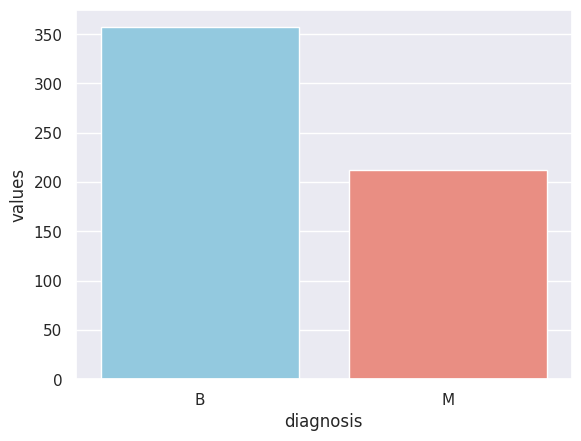

In [ ]:
colors = ['skyblue', 'salmon']
temp = dataset['diagnosis'].value_counts()
temp_df = pd.DataFrame({'diagnosis': temp.index,'values': temp.values})
print(sns.barplot(x = 'diagnosis', y = 'values', data = temp_df, palette=colors))

In [ ]:
x.describe().T

,count,mean,std,min,25%,50%,75%,max
radius_mean,569.0,14.127292,3.524049,6.981000,11.700000,13.370000,15.780000,28.11000
texture_mean,569.0,19.289649,4.301036,9.710000,16.170000,18.840000,21.800000,39.28000
perimeter_mean,569.0,91.969033,24.298981,43.790000,75.170000,86.240000,104.100000,188.50000
area_mean,569.0,654.889104,351.914129,143.500000,420.300000,551.100000,782.700000,2501.00000
smoothness_mean,569.0,0.096360,0.014064,0.052630,0.086370,0.095870,0.105300,0.16340
compactness_mean,569.0,0.104341,0.052813,0.019380,0.064920,0.092630,0.130400,0.34540
concavity_mean,569.0,0.088799,0.079720,0.000000,0.029560,0.061540,0.130700,0.42680
concave points_mean,569.0,0.048919,0.038803,0.000000,0.020310,0.033500,0.074000,0.20120
symmetry_mean,569.0,0.181162,0.027414,0.106000,0.161900,0.179200,0.195700,0.30400
fractal_dimension_mean,569.0,0.062798,0.007060,0.049960,0.057700,0.061540,0.066120,0.09744


#GRAPHICAL VISUALIZATIONS

VIOLIN PLOT

(array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9]),
 [Text(0, 0, 'radius_mean'),
  Text(1, 0, 'texture_mean'),
  Text(2, 0, 'perimeter_mean'),
  Text(3, 0, 'area_mean'),
  Text(4, 0, 'smoothness_mean'),
  Text(5, 0, 'compactness_mean'),
  Text(6, 0, 'concavity_mean'),
  Text(7, 0, 'concave points_mean'),
  Text(8, 0, 'symmetry_mean'),
  Text(9, 0, 'fractal_dimension_mean')])

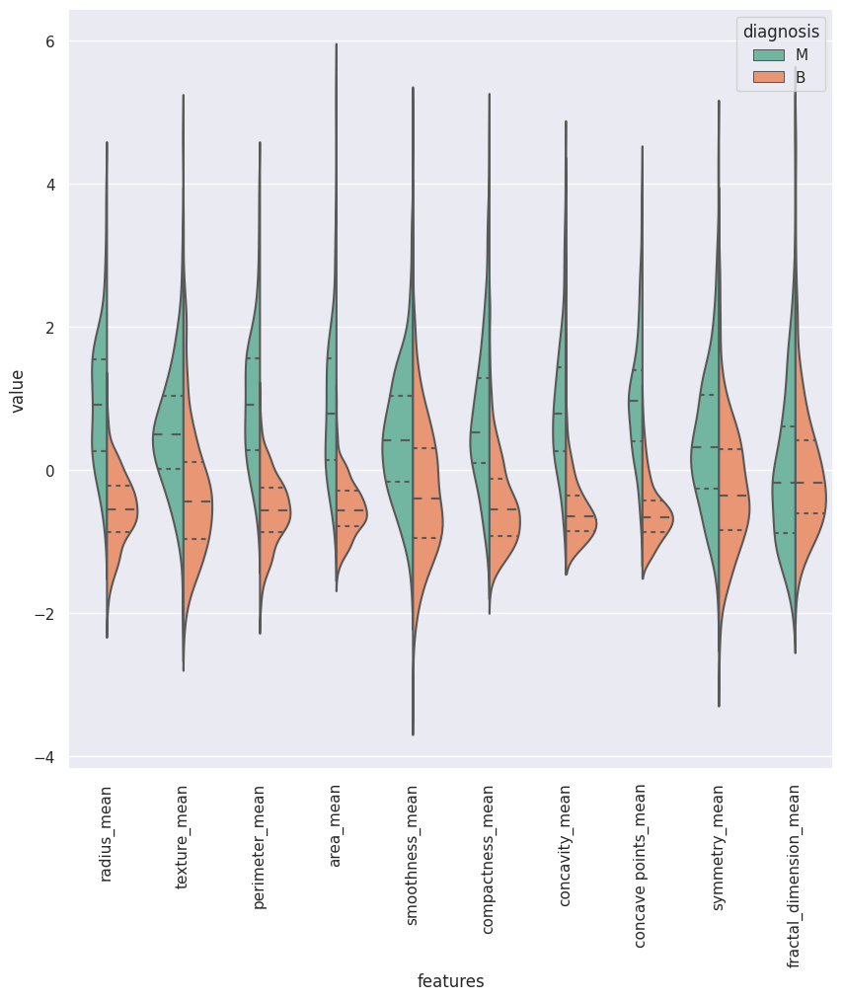

In [ ]:
# first ten features
data_dia = y
data = x
# standardization of the data
data_n_2 = (data - data.mean()) / (data.std())
data = pd.concat([y,data_n_2.iloc[:,0:10]],axis=1)
data = pd.melt(data,id_vars="diagnosis",
                    var_name="features",
                    value_name='value')
plt.figure(figsize=(10,10))
sns.violinplot(x="features", y="value", hue="diagnosis", data=data,split=True, inner="quart",palette ="Set2")
plt.xticks(rotation=90)

Interpretation -

In the abpve plot, smoothness_mean and texture_mean are good features for classification as their median values for Benign and malignant are well separated.

(array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9]),
 [Text(0, 0, 'radius_se'),
  Text(1, 0, 'texture_se'),
  Text(2, 0, 'perimeter_se'),
  Text(3, 0, 'area_se'),
  Text(4, 0, 'smoothness_se'),
  Text(5, 0, 'compactness_se'),
  Text(6, 0, 'concavity_se'),
  Text(7, 0, 'concave points_se'),
  Text(8, 0, 'symmetry_se'),
  Text(9, 0, 'fractal_dimension_se')])

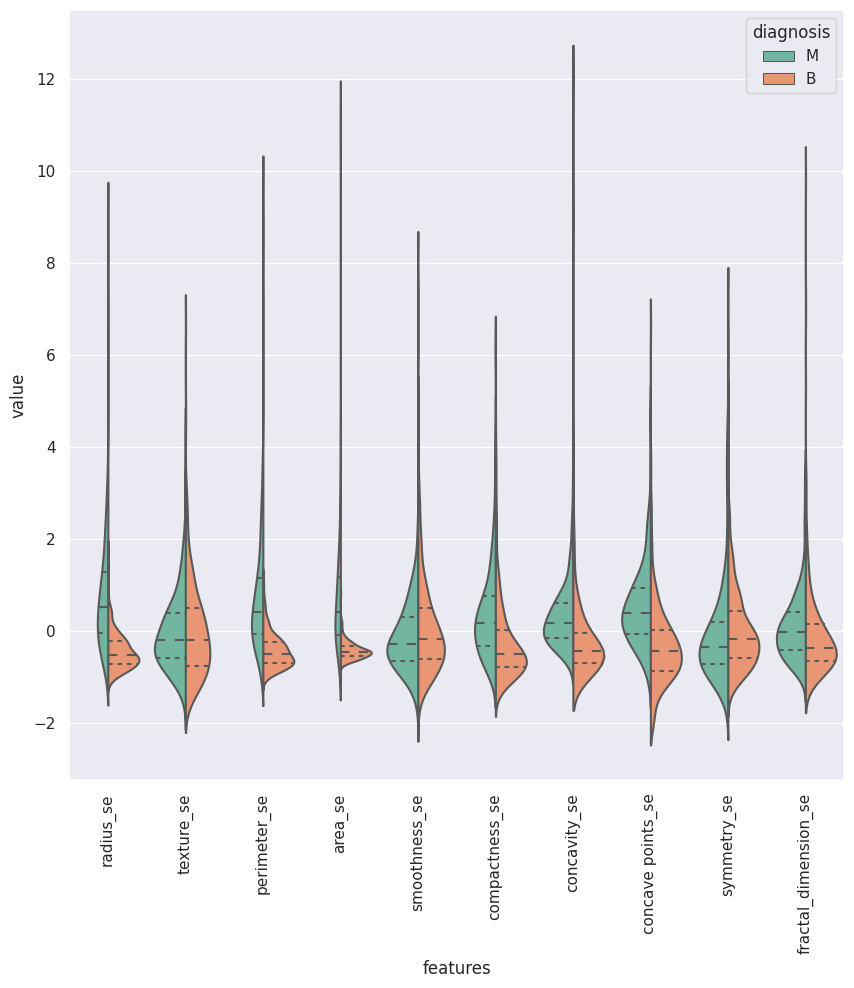

In [ ]:
# Next ten features
data = pd.concat([y,data_n_2.iloc[:,10:20]],axis=1)
data = pd.melt(data,id_vars="diagnosis",
                    var_name="features",
                    value_name='value')
plt.figure(figsize=(10,10))
sns.violinplot(x="features", y="value", hue="diagnosis", data=data,split=True, inner="quart",palette ="Set2")
plt.xticks(rotation=90)

(array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9]),
 [Text(0, 0, 'radius_worst'),
  Text(1, 0, 'texture_worst'),
  Text(2, 0, 'perimeter_worst'),
  Text(3, 0, 'area_worst'),
  Text(4, 0, 'smoothness_worst'),
  Text(5, 0, 'compactness_worst'),
  Text(6, 0, 'concavity_worst'),
  Text(7, 0, 'concave points_worst'),
  Text(8, 0, 'symmetry_worst'),
  Text(9, 0, 'fractal_dimension_worst')])

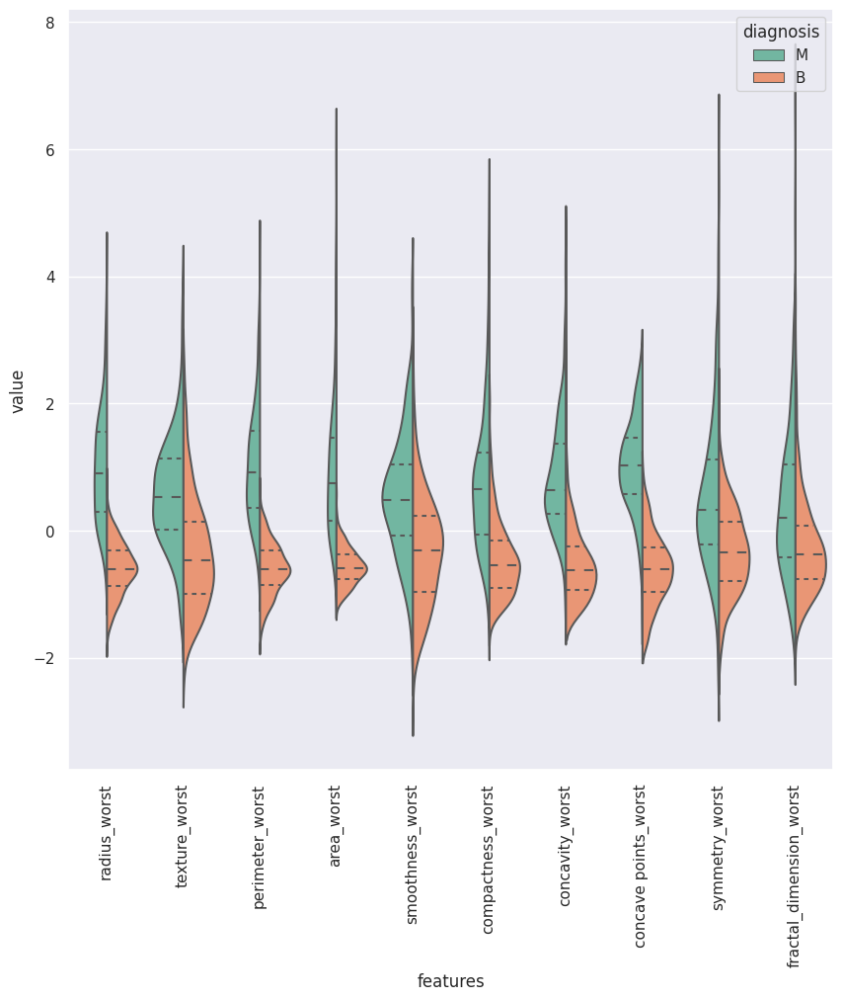

In [ ]:
# Last ten features
data = pd.concat([y,data_n_2.iloc[:,20:31]],axis=1)
data = pd.melt(data,id_vars="diagnosis",
                    var_name="features",
                    value_name='value')
plt.figure(figsize=(10,10))
sns.violinplot(x="features", y="value", hue="diagnosis", data=data,split=True, inner="quart",palette ="Set2")
plt.xticks(rotation=90)

SCATTER PLOT

<Figure size 1000x1000 with 0 Axes>

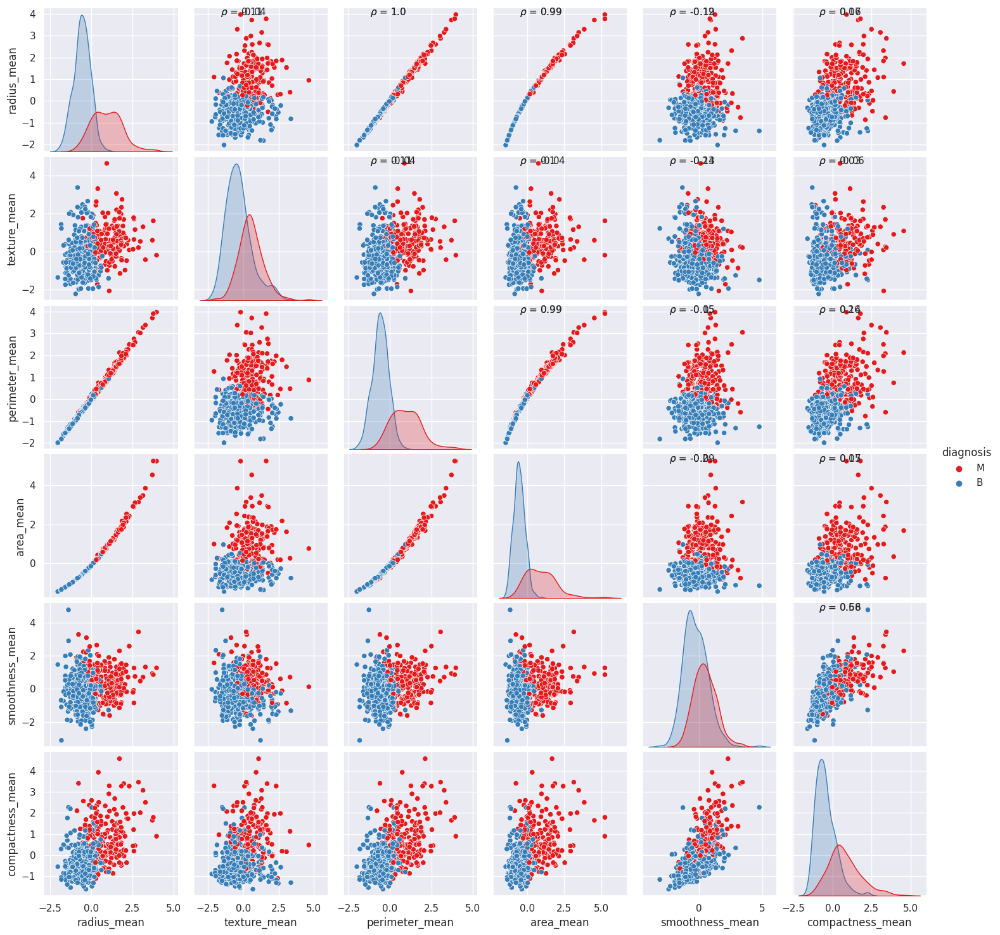

<Figure size 1000x1000 with 0 Axes>

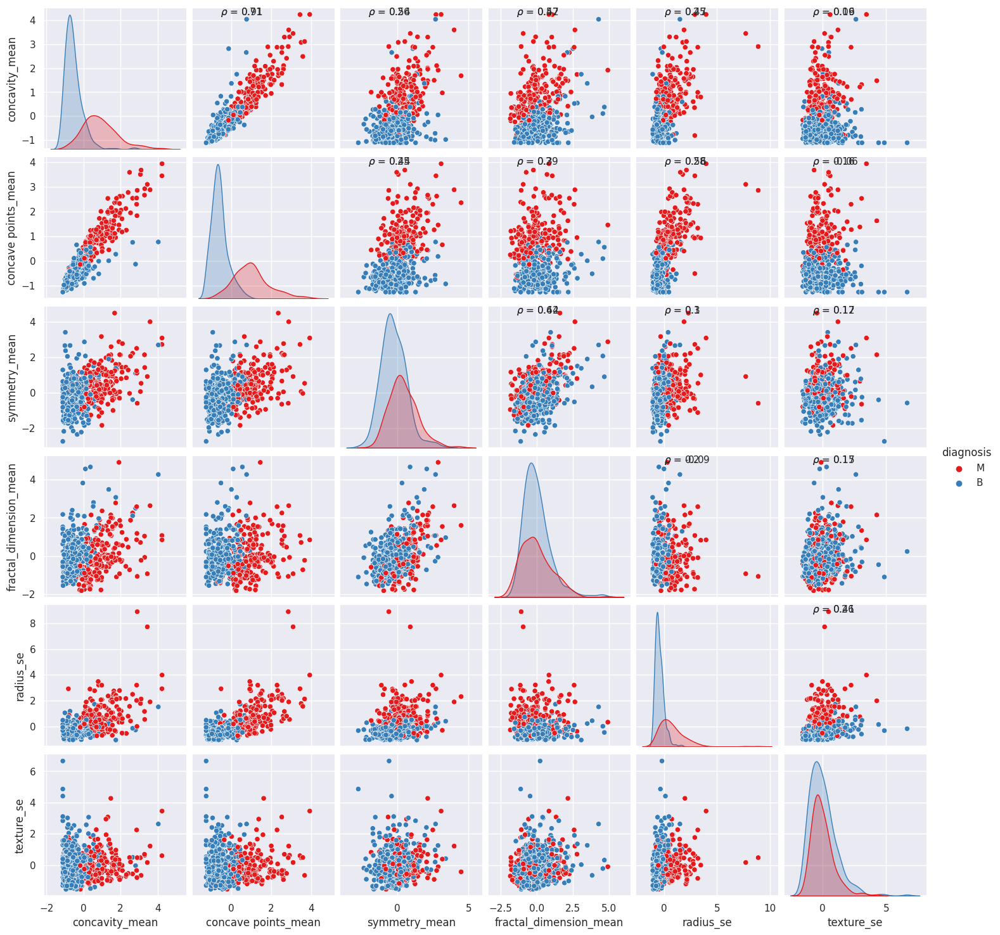

<Figure size 1000x1000 with 0 Axes>

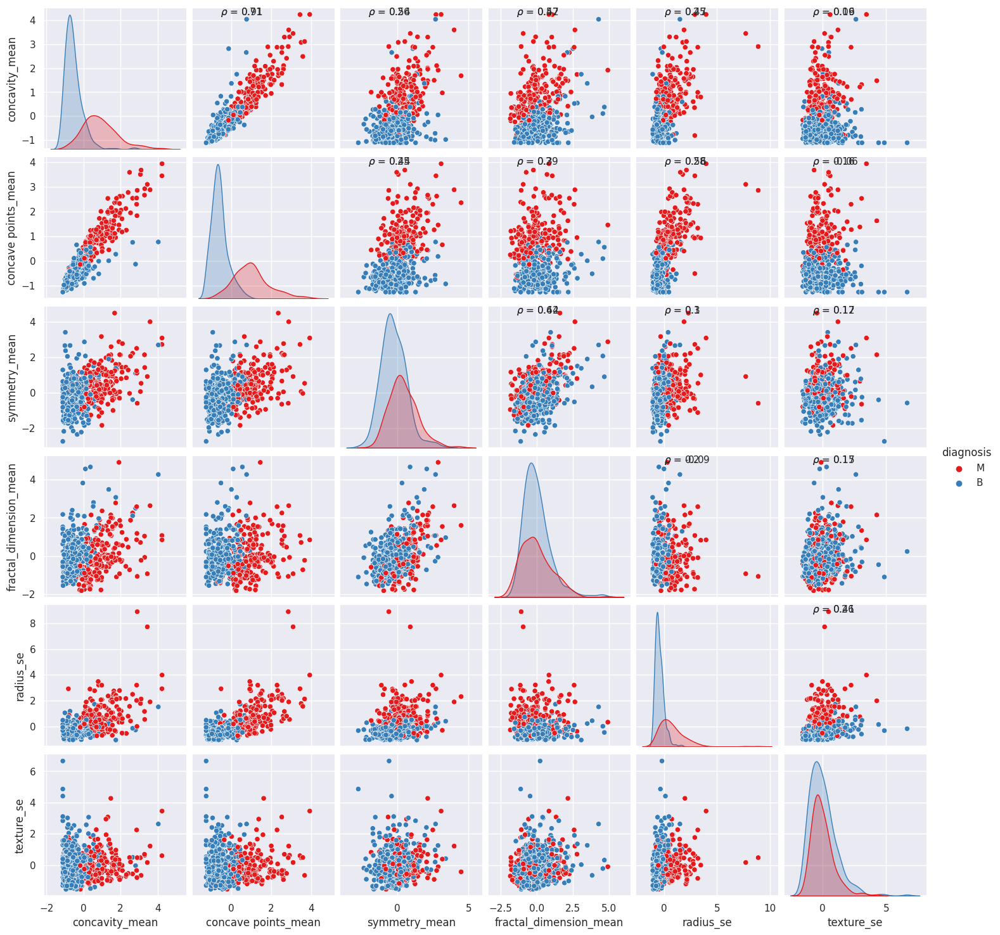

<Figure size 1000x1000 with 0 Axes>

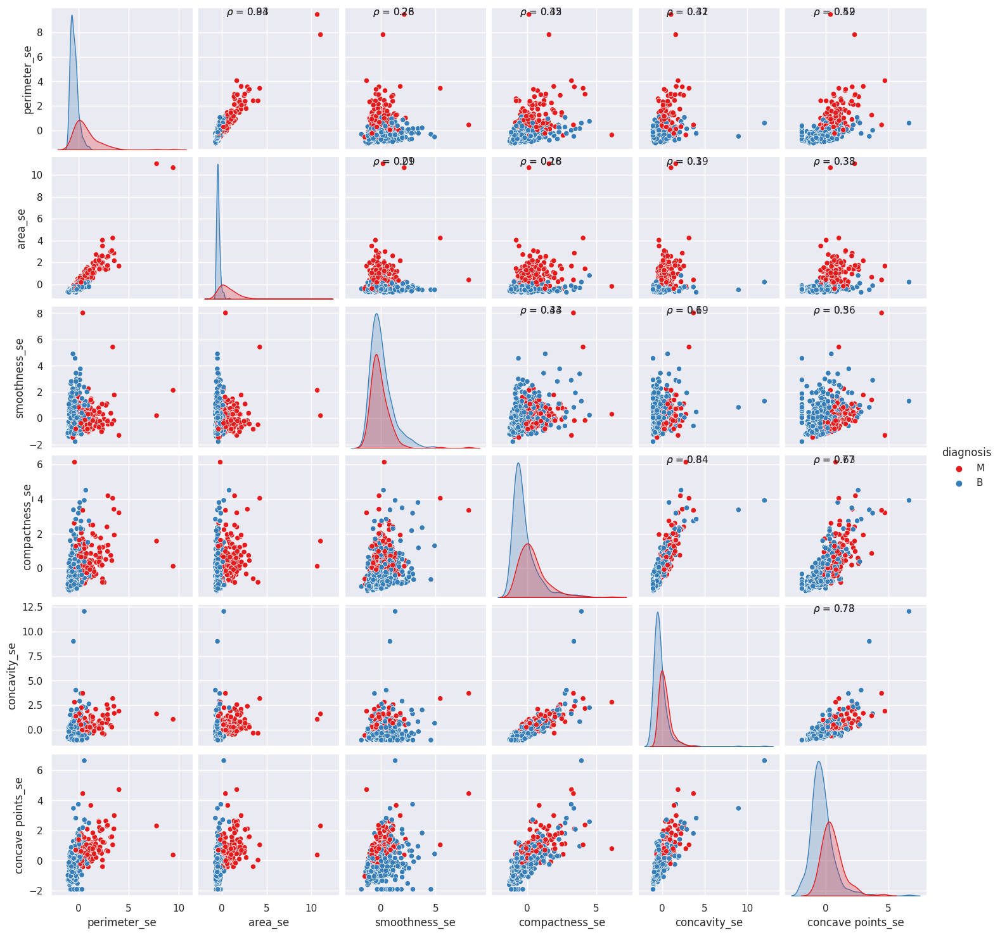

<Figure size 1000x1000 with 0 Axes>

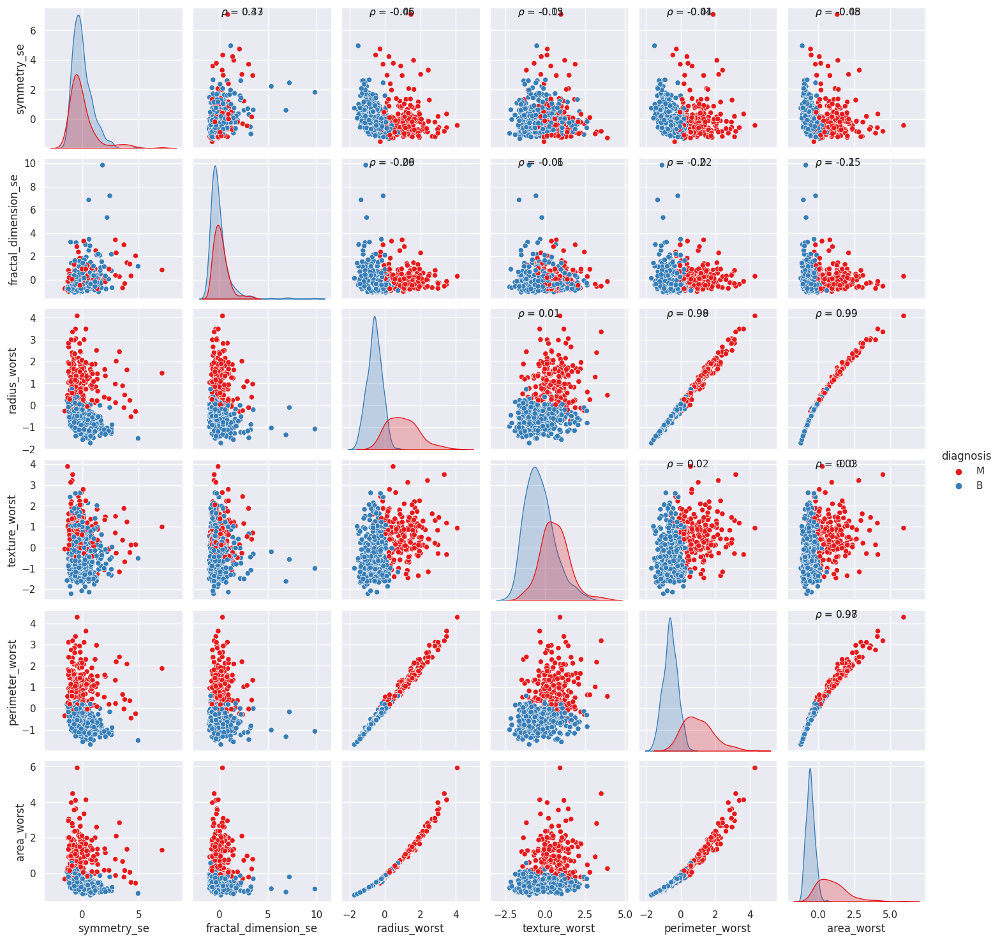

<Figure size 1000x1000 with 0 Axes>

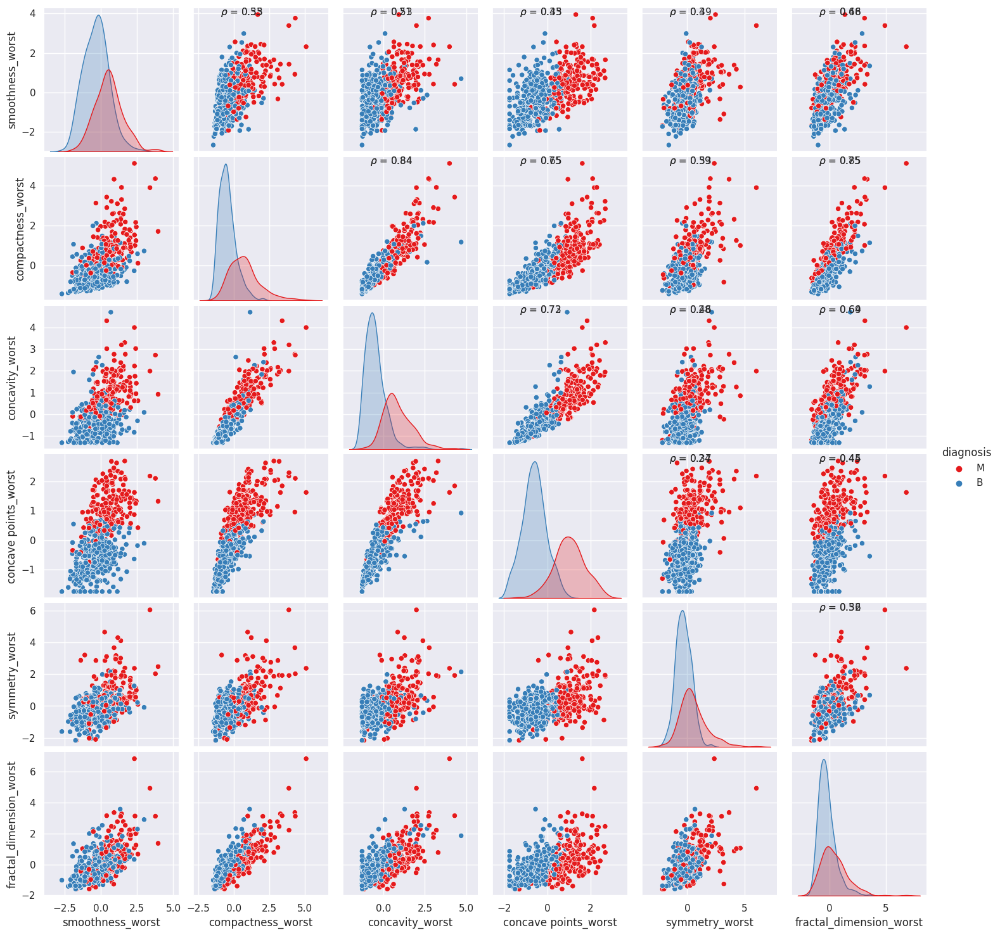

In [ ]:

def corr(x, y, **kwargs):

    coef = np.corrcoef(x, y)[0][1]
    label = r'$\rho$ = ' + str(round(coef, 2))
    ax = plt.gca()
    ax.annotate(label, xy = (0.2, 0.95), size = 11, xycoords = ax.transAxes)

data = pd.concat([y,data_n_2.iloc[:,0:6]],axis=1)
plt.figure(figsize=(10,10))
grid=sns.pairplot(data=data,kind ="scatter",hue="diagnosis",palette="Set1")
grid = grid.map_upper(corr)
data = pd.concat([y,data_n_2.iloc[:,6:12]],axis=1)
plt.figure(figsize=(10,10))
grid=sns.pairplot(data=data,kind ="scatter",hue="diagnosis",palette="Set1")
grid = grid.map_upper(corr)

data = pd.concat([y,data_n_2.iloc[:,6:12]],axis=1)
plt.figure(figsize=(10,10))
grid=sns.pairplot(data=data,kind ="scatter",hue="diagnosis",palette="Set1")
grid = grid.map_upper(corr)

data = pd.concat([y,data_n_2.iloc[:,12:18]],axis=1)
plt.figure(figsize=(10,10))
grid=sns.pairplot(data=data,kind ="scatter",hue="diagnosis",palette="Set1")
grid = grid.map_upper(corr)

data = pd.concat([y,data_n_2.iloc[:,18:24]],axis=1)
plt.figure(figsize=(10,10))
grid=sns.pairplot(data=data,kind ='scatter',hue='diagnosis',palette="Set1")
grid = grid.map_upper(corr)

data = pd.concat([y,data_n_2.iloc[:,24:32]],axis=1)
plt.figure(figsize=(10,10))
grid=sns.pairplot(data=data,kind ="scatter",hue="diagnosis",palette="Set1")
grid = grid.map_upper(corr)


SWARM PLOT

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3544: UserWarning: 40.6% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3544: UserWarning: 40.2% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3544: UserWarning: 45.5% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3544: UserWarning: 38.3% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3544: UserWarning: 43.9% of the points cannot be plac

([0, 1, 2, 3, 4, 5, 6, 7, 8, 9],
 [Text(0, 0, 'radius_mean'),
  Text(1, 0, 'texture_mean'),
  Text(2, 0, 'perimeter_mean'),
  Text(3, 0, 'area_mean'),
  Text(4, 0, 'smoothness_mean'),
  Text(5, 0, 'compactness_mean'),
  Text(6, 0, 'concavity_mean'),
  Text(7, 0, 'concave points_mean'),
  Text(8, 0, 'symmetry_mean'),
  Text(9, 0, 'fractal_dimension_mean')])

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3544: UserWarning: 41.3% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3544: UserWarning: 41.1% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3544: UserWarning: 46.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3544: UserWarning: 38.7% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3544: UserWarning: 44.1% of the points cannot be plac

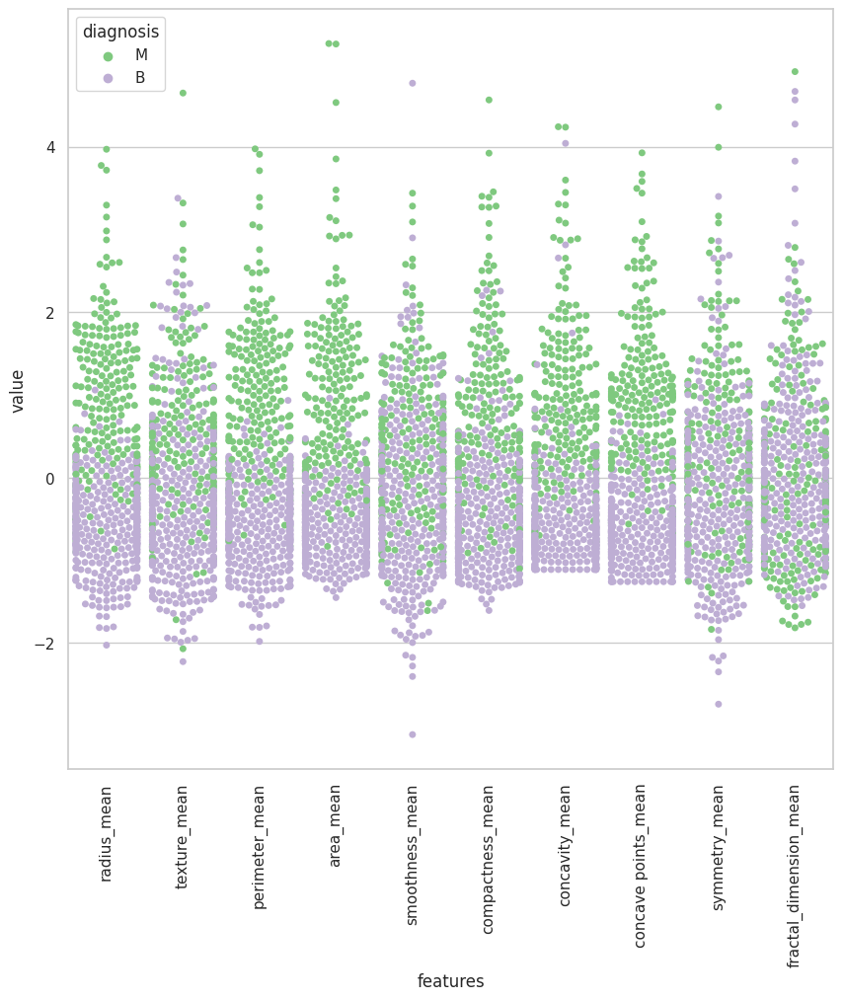

In [ ]:
# First ten features
sns.set(style="whitegrid", palette="Accent")
data_dia = y
data = x
data_n_2 = (data - data.mean()) / (data.std())
data = pd.concat([y,data_n_2.iloc[:,0:10]],axis=1)
data = pd.melt(data,id_vars="diagnosis",
                    var_name="features",
                    value_name='value')
plt.figure(figsize=(10,10))
tic = time.time()
sns.swarmplot(x="features", y="value", hue="diagnosis", data=data)
plt.xticks(rotation=90)


/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3544: UserWarning: 64.7% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3544: UserWarning: 61.2% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3544: UserWarning: 66.4% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3544: UserWarning: 71.2% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3544: UserWarning: 61.7% of the points cannot be plac

([0, 1, 2, 3, 4, 5, 6, 7, 8, 9],
 [Text(0, 0, 'radius_se'),
  Text(1, 0, 'texture_se'),
  Text(2, 0, 'perimeter_se'),
  Text(3, 0, 'area_se'),
  Text(4, 0, 'smoothness_se'),
  Text(5, 0, 'compactness_se'),
  Text(6, 0, 'concavity_se'),
  Text(7, 0, 'concave points_se'),
  Text(8, 0, 'symmetry_se'),
  Text(9, 0, 'fractal_dimension_se')])

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3544: UserWarning: 64.9% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3544: UserWarning: 61.3% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3544: UserWarning: 66.6% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3544: UserWarning: 71.4% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3544: UserWarning: 62.0% of the points cannot be plac

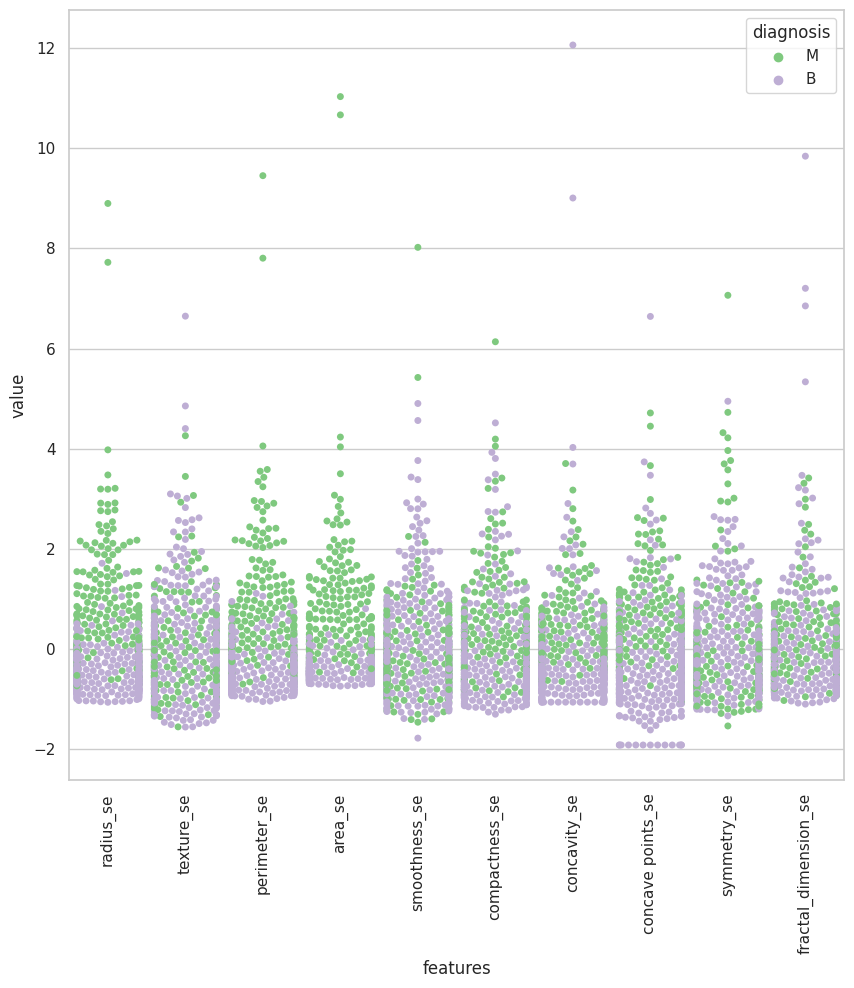

In [ ]:
# Next ten features
data = pd.concat([y,data_n_2.iloc[:,10:20]],axis=1)
data = pd.melt(data,id_vars="diagnosis",
                    var_name="features",
                    value_name='value')
plt.figure(figsize=(10,10))
sns.swarmplot(x="features", y="value", hue="diagnosis", data=data)
plt.xticks(rotation=90)

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3544: UserWarning: 46.4% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3544: UserWarning: 43.8% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3544: UserWarning: 46.6% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3544: UserWarning: 53.4% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3544: UserWarning: 42.9% of the points cannot be plac

([0, 1, 2, 3, 4, 5, 6, 7, 8, 9],
 [Text(0, 0, 'radius_worst'),
  Text(1, 0, 'texture_worst'),
  Text(2, 0, 'perimeter_worst'),
  Text(3, 0, 'area_worst'),
  Text(4, 0, 'smoothness_worst'),
  Text(5, 0, 'compactness_worst'),
  Text(6, 0, 'concavity_worst'),
  Text(7, 0, 'concave points_worst'),
  Text(8, 0, 'symmetry_worst'),
  Text(9, 0, 'fractal_dimension_worst')])

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3544: UserWarning: 46.7% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3544: UserWarning: 44.3% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3544: UserWarning: 53.8% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3544: UserWarning: 43.4% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3544: UserWarning: 50.1% of the points cannot be plac

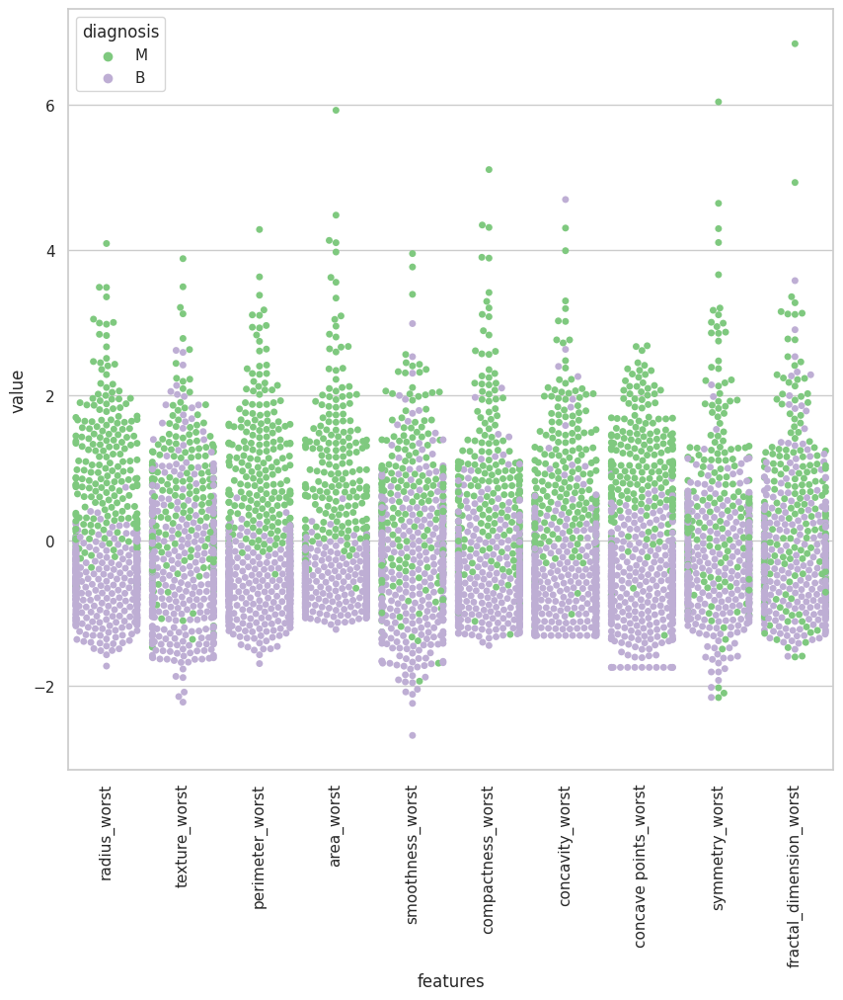

In [ ]:
# Next ten features
data = pd.concat([y,data_n_2.iloc[:,20:31]],axis=1)
data = pd.melt(data,id_vars="diagnosis",
                    var_name="features",
                    value_name='value')
plt.figure(figsize=(10,10))
sns.swarmplot(x="features", y="value", hue="diagnosis", data=data)
toc = time.time()
plt.xticks(rotation=90)

In [ ]:
dataset['Result']=[1 if value=='M' else 0 for value in dataset['diagnosis']]

In [ ]:
dataset=dataset.drop(['diagnosis','id','Unnamed: 32'],axis='columns')

HISTOGRAM

array([[<Axes: title={'center': 'radius_mean'}>,
        <Axes: title={'center': 'texture_mean'}>,
        <Axes: title={'center': 'perimeter_mean'}>,
        <Axes: title={'center': 'area_mean'}>,
        <Axes: title={'center': 'smoothness_mean'}>,
        <Axes: title={'center': 'compactness_mean'}>],
       [<Axes: title={'center': 'concavity_mean'}>,
        <Axes: title={'center': 'concave points_mean'}>,
        <Axes: title={'center': 'symmetry_mean'}>,
        <Axes: title={'center': 'fractal_dimension_mean'}>,
        <Axes: title={'center': 'radius_se'}>,
        <Axes: title={'center': 'texture_se'}>],
       [<Axes: title={'center': 'perimeter_se'}>,
        <Axes: title={'center': 'area_se'}>,
        <Axes: title={'center': 'smoothness_se'}>,
        <Axes: title={'center': 'compactness_se'}>,
        <Axes: title={'center': 'concavity_se'}>,
        <Axes: title={'center': 'concave points_se'}>],
       [<Axes: title={'center': 'symmetry_se'}>,
        <Axes: title={'ce

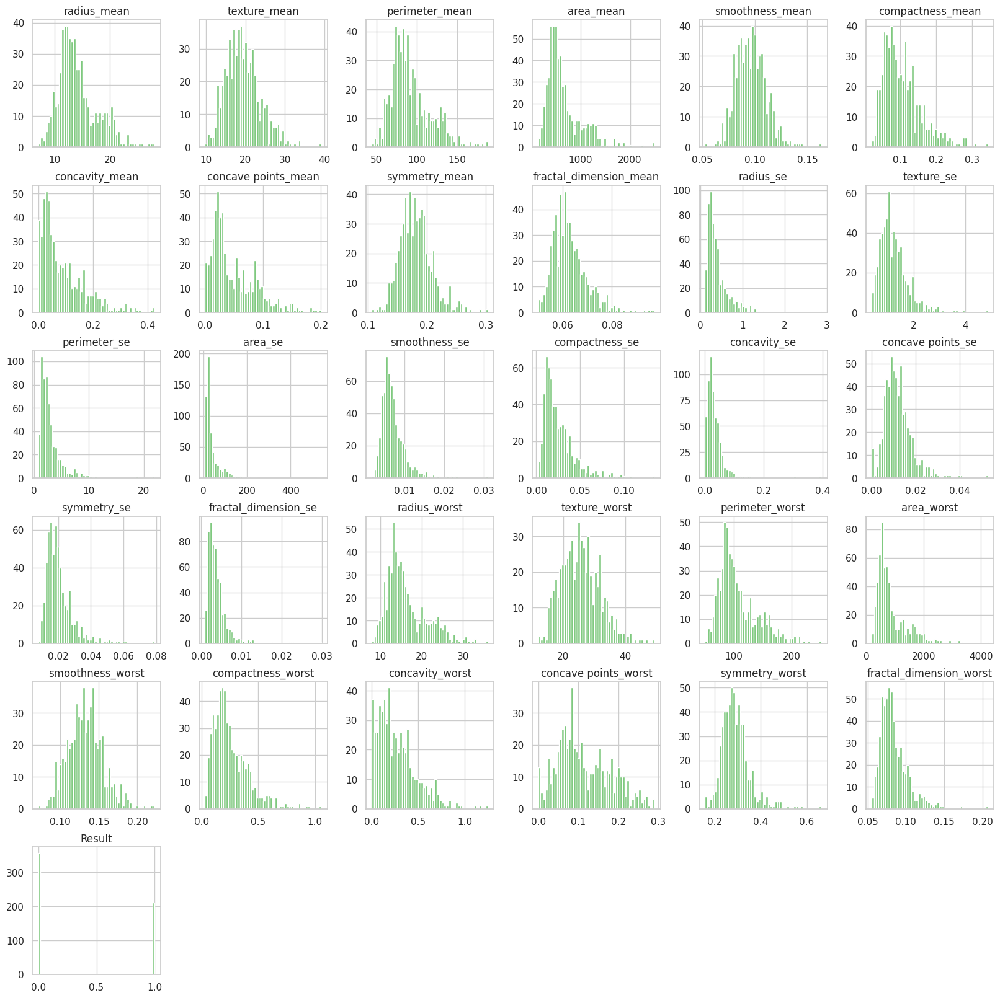

In [ ]:
dataset.hist(bins=50,figsize=(20,20))

In [ ]:
corr_dataset=pd.DataFrame(dataset.corr()['Result'].drop(['Result']))

In [ ]:
corr_dataset

,Result
radius_mean,0.730029
texture_mean,0.415185
perimeter_mean,0.742636
area_mean,0.708984
smoothness_mean,0.358560
compactness_mean,0.596534
concavity_mean,0.696360
concave points_mean,0.776614
symmetry_mean,0.330499
fractal_dimension_mean,-0.012838


HEAT MAP

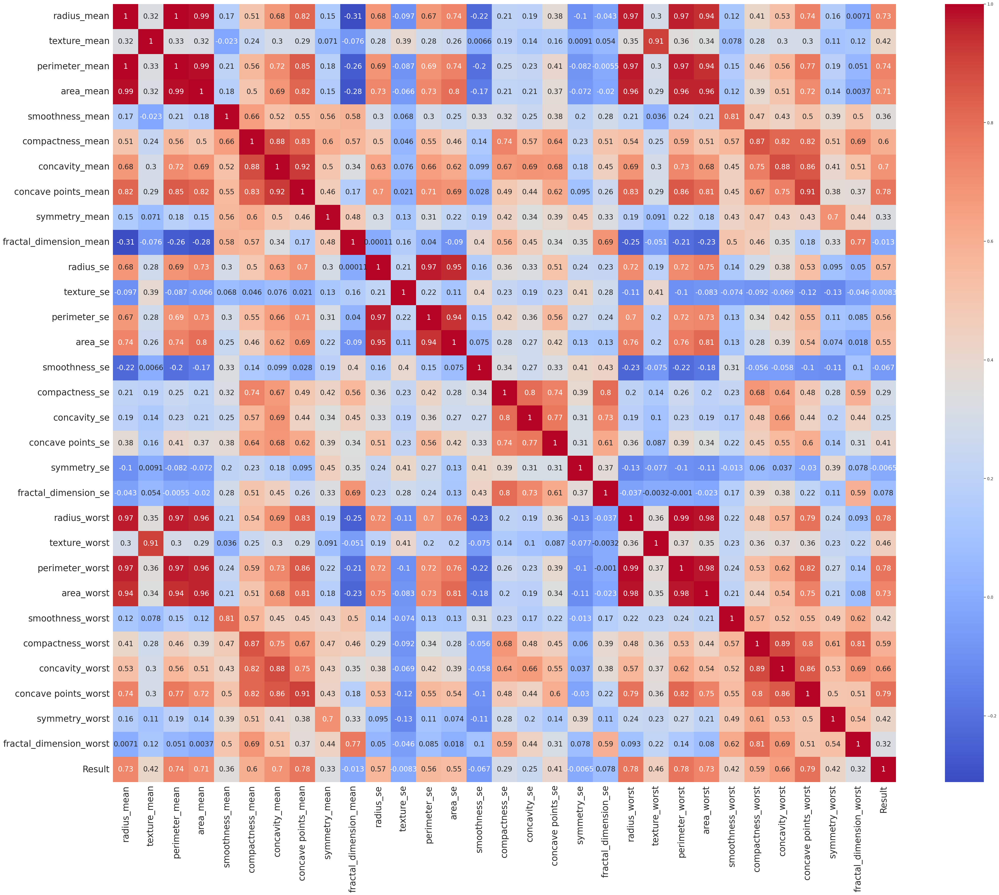

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(50, 40))
heatmap = sns.heatmap(dataset.corr(), annot=True, cmap='coolwarm', annot_kws={"size": 20})

# Increase x-axis label size
heatmap.set_xticklabels(heatmap.get_xticklabels(), fontsize=25)

# Increase y-axis label size
heatmap.set_yticklabels(heatmap.get_yticklabels(), fontsize=25)

plt.show()


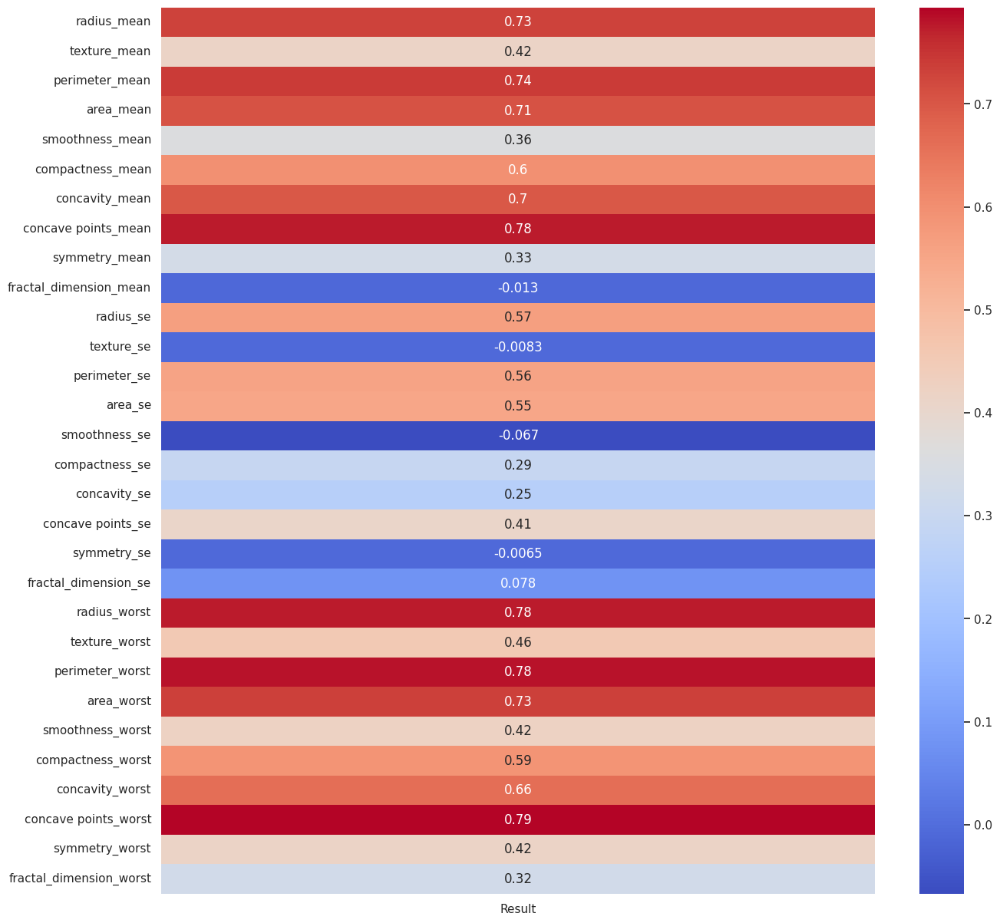

In [ ]:
import seaborn as sns
plt.figure(figsize=(15,15))
sns.heatmap(corr_dataset,annot=True,cbar=True, cmap='coolwarm')
plt.show()

In [ ]:
corr_mask = corr_dataset[corr_dataset['Result']<=0.3]

In [ ]:
corr_mask.index

Index(['fractal_dimension_mean', 'texture_se', 'smoothness_se',
       'compactness_se', 'concavity_se', 'symmetry_se',
       'fractal_dimension_se'],
      dtype='object')

In [ ]:
corr_dataset.drop(corr_mask.index)

,Result
radius_mean,0.730029
texture_mean,0.415185
perimeter_mean,0.742636
area_mean,0.708984
smoothness_mean,0.358560
compactness_mean,0.596534
concavity_mean,0.696360
concave points_mean,0.776614
symmetry_mean,0.330499
radius_se,0.567134


In [ ]:
features = corr_dataset.drop(corr_mask.index).index

In [ ]:
len(features)

23

#DATA PRE-PROCESSING AND MODEL BUILDING

In [ ]:
from sklearn import preprocessing

df_enco = dataset.apply(preprocessing.LabelEncoder().fit_transform)
df_enco
x = dataset[features]
y = dataset['Result']

In [ ]:
y

0      1
1      1
2      1
3      1
4      1
      ..
564    1
565    1
566    1
567    1
568    0
Name: Result, Length: 569, dtype: int64

NORMALIZATION

In [ ]:
scaler = StandardScaler()

In [ ]:
scaled_data = scaler.fit_transform(x)

RANDOM FOREST

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import precision_score, classification_report

x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42)

random_forest_classifier = RandomForestClassifier(n_estimators=100, random_state=42)

random_forest_classifier.fit(x_train, y_train)

y_pred = random_forest_classifier.predict(x_test)

precision = precision_score(y_test, y_pred)

print(f"Precision: {precision}")
print("Classification Report:\n", classification_report(y_test, y_pred))


Precision: 0.975609756097561
Classification Report:
               precision    recall  f1-score   support

           0       0.96      0.99      0.97        71
           1       0.98      0.93      0.95        43

    accuracy                           0.96       114
   macro avg       0.97      0.96      0.96       114
weighted avg       0.97      0.96      0.96       114



DECISION TREE

In [ ]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report

x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=20)

dt_classifier = DecisionTreeClassifier(random_state=20)

dt_classifier.fit(x_train, y_train)

y_pred = dt_classifier.predict(x_test)

precision = precision_score(y_test, y_pred)

print(f"Precision: {precision}")
print("Classification Report:\n", classification_report(y_test, y_pred))

Precision: 0.9166666666666666
Classification Report:
               precision    recall  f1-score   support

           0       0.94      0.94      0.94        66
           1       0.92      0.92      0.92        48

    accuracy                           0.93       114
   macro avg       0.93      0.93      0.93       114
weighted avg       0.93      0.93      0.93       114



K-NEAREST NEIGHBOURS

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report

x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=20)

knn_classifier = KNeighborsClassifier(n_neighbors=5)

knn_classifier.fit(x_train, y_train)

y_pred = knn_classifier.predict(x_test)

precision = precision_score(y_test, y_pred)

print(f"Precision: {precision}")
print("Classification Report:\n", classification_report(y_test, y_pred))

Precision: 0.9555555555555556
Classification Report:
               precision    recall  f1-score   support

           0       0.93      0.97      0.95        66
           1       0.96      0.90      0.92        48

    accuracy                           0.94       114
   macro avg       0.94      0.93      0.94       114
weighted avg       0.94      0.94      0.94       114



In [ ]:
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(x,y, test_size=0.2 , random_state = 42)

LOGISTIC REGRESSION

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report

x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=20)

logreg_classifier = LogisticRegression(random_state=20)

logreg_classifier.fit(x_train, y_train)

y_pred = logreg_classifier.predict(x_test)

precision = precision_score(y_test, y_pred)

print(f"Precision: {precision}")
print("Classification Report:\n", classification_report(y_test, y_pred))


Precision: 0.9361702127659575
Classification Report:
               precision    recall  f1-score   support

           0       0.94      0.95      0.95        66
           1       0.94      0.92      0.93        48

    accuracy                           0.94       114
   macro avg       0.94      0.94      0.94       114
weighted avg       0.94      0.94      0.94       114



/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


NAIVE BAYES

In [ ]:
from sklearn.naive_bayes import GaussianNB
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report

x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=20)

naive_bayes_classifier = GaussianNB()

naive_bayes_classifier.fit(x_train, y_train)

y_pred = naive_bayes_classifier.predict(x_test)

precision = precision_score(y_test, y_pred)

print(f"Precision: {precision}")
print("Classification Report:\n", classification_report(y_test, y_pred))


Precision: 0.9777777777777777
Classification Report:
               precision    recall  f1-score   support

           0       0.94      0.98      0.96        66
           1       0.98      0.92      0.95        48

    accuracy                           0.96       114
   macro avg       0.96      0.95      0.95       114
weighted avg       0.96      0.96      0.96       114



SUPPORT VECTOR MACHINE CLASSIFIER

In [ ]:
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report

x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=20)

svm_classifier = SVC(kernel='linear')

svm_classifier.fit(x_train, y_train)

y_pred = svm_classifier.predict(x_test)

precision = precision_score(y_test, y_pred)

print(f"Precision: {precision}")
print("Classification Report:\n", classification_report(y_test, y_pred))


Precision: 0.9375
Classification Report:
               precision    recall  f1-score   support

           0       0.95      0.95      0.95        66
           1       0.94      0.94      0.94        48

    accuracy                           0.95       114
   macro avg       0.95      0.95      0.95       114
weighted avg       0.95      0.95      0.95       114



In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import precision_score

In [ ]:
models = {'Logistic_Regression': LogisticRegression(),
          'dt_classifier' : DecisionTreeClassifier(),
          'rf_classifer':RandomForestClassifier(),
          'Naive_Bayes':GaussianNB(),
          'SVM':SVC(kernel = 'rbf'),
          'KNN':KNeighborsClassifier(n_neighbors = 10)}

COMBINED ACCURACY AND PRECISION SCORE

In [ ]:
from sklearn.metrics import accuracy_score, precision_score, f1_score

for i in models:
    obj = models[i]
    obj.fit(x_train, y_train)
    obj_pred = obj.predict(x_test)

    accuracy = accuracy_score(y_test, obj_pred)
    precision = precision_score(y_test, obj_pred, zero_division=1)
    f1 = f1_score(y_test, obj_pred, zero_division=1)

    print('Metrics for ' + i + ':')
    print('Accuracy: ', accuracy)
    print('Precision: ', precision)
    print('F1-Score: ', f1)
    print('\n')


Metrics for Logistic_Regression:
Accuracy:  0.9385964912280702
Precision:  0.9361702127659575
F1-Score:  0.9263157894736843


Metrics for dt_classifier:
Accuracy:  0.9298245614035088
Precision:  0.9166666666666666
F1-Score:  0.9166666666666666




/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Metrics for rf_classifer:
Accuracy:  0.9736842105263158
Precision:  1.0
F1-Score:  0.967741935483871


Metrics for Naive_Bayes:
Accuracy:  0.956140350877193
Precision:  0.9777777777777777
F1-Score:  0.946236559139785


Metrics for SVM:
Accuracy:  0.9298245614035088
Precision:  1.0
F1-Score:  0.9090909090909091


Metrics for KNN:
Accuracy:  0.9473684210526315
Precision:  0.9772727272727273
F1-Score:  0.9347826086956522




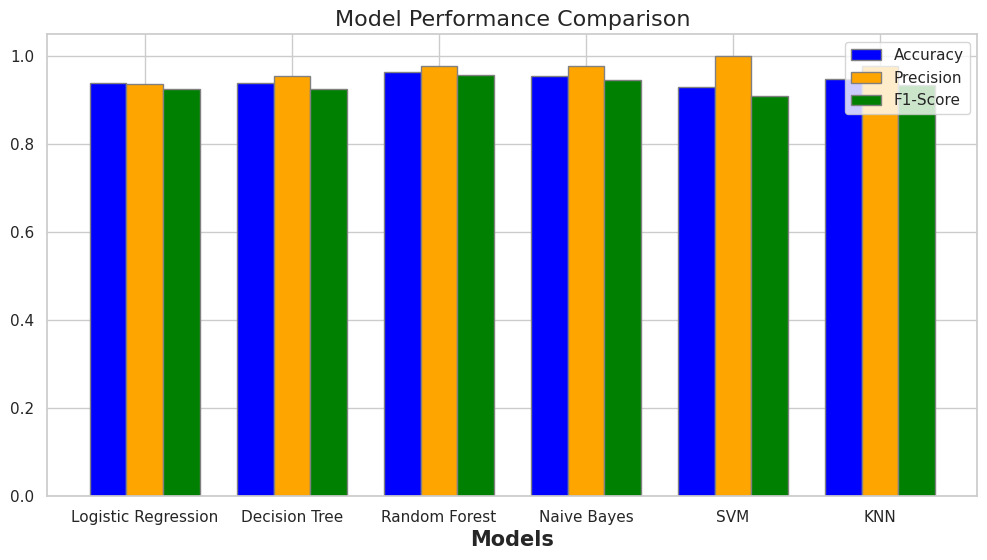

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

models = ['Logistic Regression', 'Decision Tree', 'Random Forest', 'Naive Bayes', 'SVM', 'KNN']
accuracy = [0.9386, 0.9386, 0.9649, 0.9561, 0.9298, 0.9474]
precision = [0.9362, 0.9556, 0.9783, 0.9778, 1.0, 0.9773]
f1_score = [0.9263, 0.9247, 0.9574, 0.9462, 0.9091, 0.9348]

barWidth = 0.25
r1 = np.arange(len(models))
r2 = [x + barWidth for x in r1]
r3 = [x + barWidth for x in r2]

plt.figure(figsize=(12, 6))

plt.bar(r1, accuracy, color='blue', width=barWidth, edgecolor='grey', label='Accuracy')
plt.bar(r2, precision, color='orange', width=barWidth, edgecolor='grey', label='Precision')
plt.bar(r3, f1_score, color='green', width=barWidth, edgecolor='grey', label='F1-Score')

plt.xlabel('Models', fontweight='bold', fontsize=15)
plt.xticks([r + barWidth for r in range(len(models))], models)

plt.legend()

plt.title('Model Performance Comparison', fontsize=16)

plt.show()


In [ ]:
import pandas as pd

metrics_data = {
    'Model': ['Logistic_Regression', 'dt_classifier', 'rf_classifer', 'Naive_Bayes', 'SVM', 'KNN'],
    'Accuracy': [0.9386, 0.9386, 0.9649, 0.9561, 0.9298, 0.9474],
    'Precision': [0.9362, 0.9556, 0.9783, 0.9778, 1.0, 0.9773],
    'F1-Score': [0.9263, 0.9247, 0.9574, 0.9462, 0.9091, 0.9348]
}

metrics_df = pd.DataFrame(metrics_data)

print("Metrics Table:")
print(metrics_df)

best_model = metrics_df.loc[metrics_df['Precision'].idxmax()]

print("\nBest Model:")
print(best_model['Model'], "is the best model based on Precision.")
print("Conclusion:", best_model['Model'], "is recommended for breast cancer diagnosis.")


Metrics Table:
                 Model  Accuracy  Precision  F1-Score
0  Logistic_Regression    0.9386     0.9362    0.9263
1        dt_classifier    0.9386     0.9556    0.9247
2         rf_classifer    0.9649     0.9783    0.9574
3          Naive_Bayes    0.9561     0.9778    0.9462
4                  SVM    0.9298     1.0000    0.9091
5                  KNN    0.9474     0.9773    0.9348

Best Model:
SVM is the best model based on Precision.
Conclusion: SVM is recommended for breast cancer diagnosis.
